<a href="https://colab.research.google.com/github/Aakash-mishra2/electricity-bill-by-devices-clustering/blob/main/Electricity_consumption_segmantation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
import plotly.express as px
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
import plotly.express as px
import plotly.graph_objects as go

from google.colab import files #library to upload files to colab notebook
%matplotlib inline

In [2]:
# Mount the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Data set link : https://www.kaggle.com/datasets/suraj520/indian-household-electricity-bill/data

In [ ]:
electricity_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Indian Electricity_data/electricity_bill_dataset.csv', encoding = 'unicode_escape')
# Note: MSRP is the manufacturer's suggested retail price (MSRP) or sticker price represents the suggested retail price of products.
# MSRP is used to standardize the price of products over multiple company store locations.

In [ ]:
electricity_df

,Fan,Refrigerator,AirConditioner,Television,Monitor,MotorPump,Month,City,Company,MonthlyHours,TariffRate,ElectricityBill
0,16,23.0,2.0,6.0,1.0,0,10,Hyderabad,Tata Power Company Ltd.,384,8.4,3225.6
1,19,22.0,2.0,3.0,1.0,0,5,Vadodara,NHPC,488,7.8,3806.4
2,7,20.0,2.0,6.0,7.0,0,7,Shimla,Jyoti Structure,416,7.7,3203.2
3,7,22.0,3.0,21.0,1.0,0,6,Mumbai,Power Grid Corp,475,9.2,4370.0
4,11,23.0,2.0,11.0,1.0,0,2,Mumbai,Ratnagiri Gas and Power Pvt. Ltd. (RGPPL),457,9.2,4204.4
...,...,...,...,...,...,...,...,...,...,...,...,...
45340,18,22.0,3.0,22.0,1.0,0,9,Ahmedabad,Maha Transco â Maharashtra State Electricity...,764,7.9,6035.6
45341,23,23.0,2.0,6.0,12.0,0,2,New Delhi,Orient Green,572,8.5,4862.0
45342,22,22.0,2.0,20.0,1.0,0,1,New Delhi,GE T&D India Limited,609,8.5,5176.5
45343,8,21.0,2.0,22.0,7.0,0,12,Ratnagiri,TransRail Lighting,748,7.4,5535.2


In [ ]:
electricity_df.dtypes

Fan                  int64
Refrigerator       float64
AirConditioner     float64
Television         float64
Monitor            float64
MotorPump            int64
Month                int64
City                object
Company             object
MonthlyHours         int64
TariffRate         float64
ElectricityBill    float64
dtype: object

In [ ]:
electricity_df.isnull().sum()

Fan                0
Refrigerator       0
AirConditioner     0
Television         0
Monitor            0
MotorPump          0
Month              0
City               0
Company            0
MonthlyHours       0
TariffRate         0
ElectricityBill    0
dtype: int64

In [ ]:
electricity_df['City'].value_counts()

Hyderabad      2914
Navi Mumbai    2914
Ratnagiri      2892
Faridabad      2891
Gurgaon        2878
Ahmedabad      2868
New Delhi      2848
Mumbai         2846
Chennai        2834
Dahej          2821
Nagpur         2816
Noida          2793
Pune           2788
Shimla         2780
Kolkata        2740
Vadodara       2722
Name: City, dtype: int64

In [ ]:
#function to store count of items in a given column
def barplot_visualization(x):
  fig = plt.Figure(figsize = (12, 6))
  fig = px.bar(x = electricity_df[x].value_counts().index, y = electricity_df[x].value_counts(), color = electricity_df[x].value_counts().index, height = 600)
  fig.show()
def barplot_visualization2(x):
  fig2 = plt.Figure(figsize = (12, 6))
  fig2 = px.bar(x = elec_df_group[x].value_counts().index, y = elec_df_group[x].value_counts(), color = elec_df_group[x].value_counts().index, height = 600)
  fig2.show()

In [ ]:
barplot_visualization('MonthlyHours')

In [ ]:
barplot_visualization('Company')

In [ ]:
electricity_df.head()

,Fan,Refrigerator,AirConditioner,Television,Monitor,MotorPump,Month,City,Company,MonthlyHours,TariffRate,ElectricityBill
0,16,23.0,2.0,6.0,1.0,0,10,Hyderabad,Tata Power Company Ltd.,384,8.4,3225.6
1,19,22.0,2.0,3.0,1.0,0,5,Vadodara,NHPC,488,7.8,3806.4
2,7,20.0,2.0,6.0,7.0,0,7,Shimla,Jyoti Structure,416,7.7,3203.2
3,7,22.0,3.0,21.0,1.0,0,6,Mumbai,Power Grid Corp,475,9.2,4370.0
4,11,23.0,2.0,11.0,1.0,0,2,Mumbai,Ratnagiri Gas and Power Pvt. Ltd. (RGPPL),457,9.2,4204.4


In [ ]:
def dummies(x):
  dummy = pd.get_dummies(electricity_df[x])
  electricity_df.drop(columns = x , inplace = True)
  return pd.concat([electricity_df, dummy], axis = 1)

In [ ]:
#remove categorial variables
electricity_df = dummies('Month')
electricity_df

,Fan,Refrigerator,AirConditioner,Television,Monitor,MotorPump,City,Company,MonthlyHours,TariffRate,...,3,4,5,6,7,8,9,10,11,12
0,16,23.0,2.0,6.0,1.0,0,Hyderabad,Tata Power Company Ltd.,384,8.4,...,0,0,0,0,0,0,0,1,0,0
1,19,22.0,2.0,3.0,1.0,0,Vadodara,NHPC,488,7.8,...,0,0,1,0,0,0,0,0,0,0
2,7,20.0,2.0,6.0,7.0,0,Shimla,Jyoti Structure,416,7.7,...,0,0,0,0,1,0,0,0,0,0
3,7,22.0,3.0,21.0,1.0,0,Mumbai,Power Grid Corp,475,9.2,...,0,0,0,1,0,0,0,0,0,0
4,11,23.0,2.0,11.0,1.0,0,Mumbai,Ratnagiri Gas and Power Pvt. Ltd. (RGPPL),457,9.2,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45340,18,22.0,3.0,22.0,1.0,0,Ahmedabad,Maha Transco â Maharashtra State Electricity...,764,7.9,...,0,0,0,0,0,0,1,0,0,0
45341,23,23.0,2.0,6.0,12.0,0,New Delhi,Orient Green,572,8.5,...,0,0,0,0,0,0,0,0,0,0
45342,22,22.0,2.0,20.0,1.0,0,New Delhi,GE T&D India Limited,609,8.5,...,0,0,0,0,0,0,0,0,0,0
45343,8,21.0,2.0,22.0,7.0,0,Ratnagiri,TransRail Lighting,748,7.4,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
electricity_df = dummies('City')
electricity_df

,Fan,Refrigerator,AirConditioner,Television,Monitor,MotorPump,Company,MonthlyHours,TariffRate,ElectricityBill,...,Kolkata,Mumbai,Nagpur,Navi Mumbai,New Delhi,Noida,Pune,Ratnagiri,Shimla,Vadodara
0,16,23.0,2.0,6.0,1.0,0,Tata Power Company Ltd.,384,8.4,3225.6,...,0,0,0,0,0,0,0,0,0,0
1,19,22.0,2.0,3.0,1.0,0,NHPC,488,7.8,3806.4,...,0,0,0,0,0,0,0,0,0,1
2,7,20.0,2.0,6.0,7.0,0,Jyoti Structure,416,7.7,3203.2,...,0,0,0,0,0,0,0,0,1,0
3,7,22.0,3.0,21.0,1.0,0,Power Grid Corp,475,9.2,4370.0,...,0,1,0,0,0,0,0,0,0,0
4,11,23.0,2.0,11.0,1.0,0,Ratnagiri Gas and Power Pvt. Ltd. (RGPPL),457,9.2,4204.4,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45340,18,22.0,3.0,22.0,1.0,0,Maha Transco â Maharashtra State Electricity...,764,7.9,6035.6,...,0,0,0,0,0,0,0,0,0,0
45341,23,23.0,2.0,6.0,12.0,0,Orient Green,572,8.5,4862.0,...,0,0,0,0,1,0,0,0,0,0
45342,22,22.0,2.0,20.0,1.0,0,GE T&D India Limited,609,8.5,5176.5,...,0,0,0,0,1,0,0,0,0,0
45343,8,21.0,2.0,22.0,7.0,0,TransRail Lighting,748,7.4,5535.2,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
#Group data by MonthlyHours
elec_df_group = electricity_df.groupby(by='MonthlyHours').sum()
elec_df_group

<ipython-input-13-c32363936c0e>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Fan,Refrigerator,AirConditioner,Television,Monitor,MotorPump,TariffRate,ElectricityBill,1,2,...,Kolkata,Mumbai,Nagpur,Navi Mumbai,New Delhi,Noida,Pune,Ratnagiri,Shimla,Vadodara
MonthlyHours,,,,,,,,,,,,,,,,,,,,,
95,5,17.0,0.0,3.0,1.0,0,8.5,807.5,0,1,...,0,0,0,0,1,0,0,0,0,0
114,6,17.0,0.0,5.0,1.0,0,9.2,1048.8,0,1,...,0,1,0,0,0,0,0,0,0,0
115,8,17.0,0.0,3.0,1.0,0,9.3,1069.5,0,0,...,0,0,0,1,0,0,0,0,0,0
126,6,20.0,0.0,3.0,1.0,0,8.2,1033.2,0,1,...,0,0,0,0,0,1,0,0,0,0
131,14,35.0,0.0,6.0,2.0,0,17.1,2240.1,0,1,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
910,46,45.0,6.0,42.0,24.0,0,17.1,15561.0,0,0,...,1,0,0,0,0,0,0,0,0,0
913,23,22.0,2.0,22.0,12.0,0,8.3,7577.9,0,0,...,0,0,0,0,0,0,0,0,0,0
917,19,23.0,3.0,21.0,12.0,0,8.4,7702.8,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
fig = px.line(x=elec_df_group.index, y=elec_df_group.ElectricityBill, title="Electricity Bill segmentation")
fig.show()

In [ ]:
elec_df_group.drop("TariffRate", axis = 1, inplace = True)
elec_df_group.shape

(748, 35)

<Axes: >

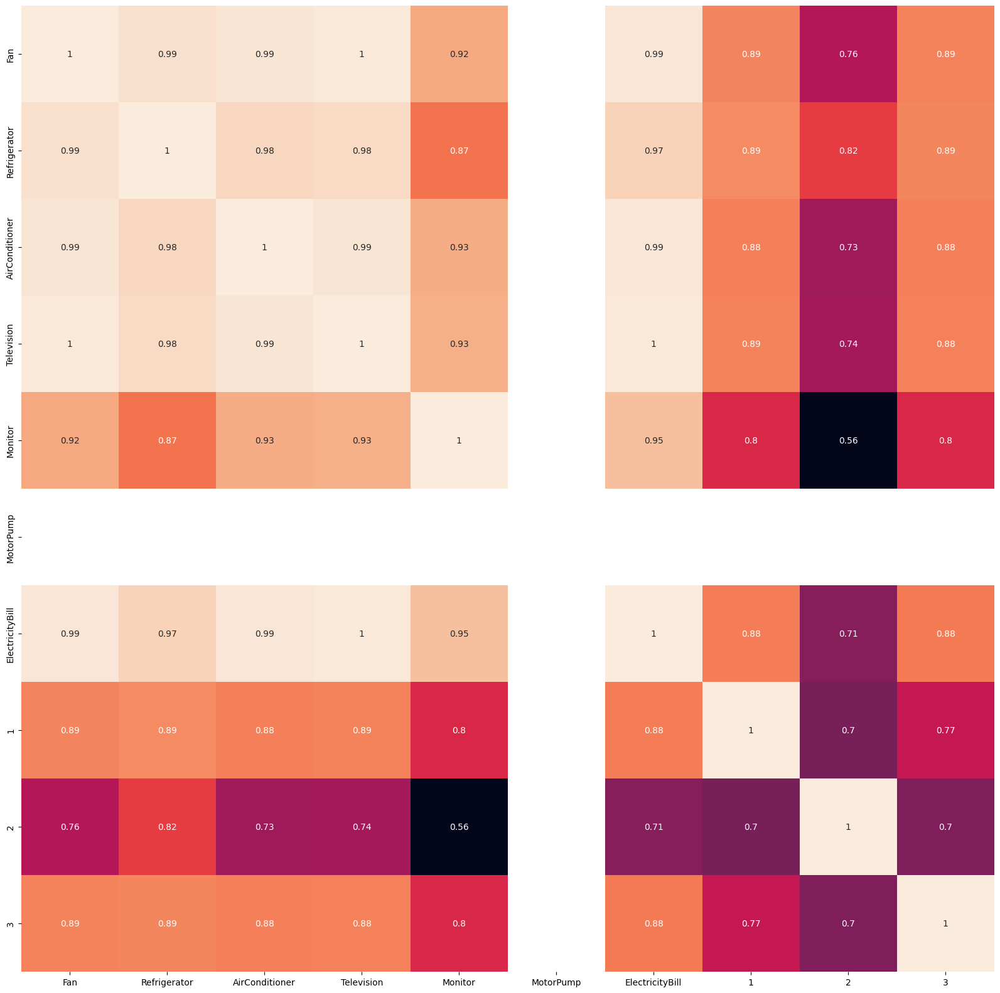

In [ ]:
#correlation matrix between the variables
plt.figure(figsize = (20, 20))
corr_matrix = elec_df_group.iloc[:, :10].corr()
sns.heatmap(corr_matrix, annot = True, cbar = False)

In [ ]:
elec_df_group.drop('MotorPump', axis=1,inplace = True)
elec_df_group.shape

(748, 34)

In [ ]:
electricity_df.dtypes

Fan                  int64
Refrigerator       float64
AirConditioner     float64
Television         float64
Monitor            float64
MotorPump            int64
Company             object
MonthlyHours         int64
TariffRate         float64
ElectricityBill    float64
1                    uint8
2                    uint8
3                    uint8
4                    uint8
5                    uint8
6                    uint8
7                    uint8
8                    uint8
9                    uint8
10                   uint8
11                   uint8
12                   uint8
Ahmedabad            uint8
Chennai              uint8
Dahej                uint8
Faridabad            uint8
Gurgaon              uint8
Hyderabad            uint8
Kolkata              uint8
Mumbai               uint8
Nagpur               uint8
Navi Mumbai          uint8
New Delhi            uint8
Noida                uint8
Pune                 uint8
Ratnagiri            uint8
Shimla               uint8
V

In [ ]:
electricity_df.drop('MotorPump', axis = 1, inplace = True)
electricity_df.head()


,Fan,Refrigerator,AirConditioner,Television,Monitor,Company,MonthlyHours,TariffRate,ElectricityBill,1,...,Kolkata,Mumbai,Nagpur,Navi Mumbai,New Delhi,Noida,Pune,Ratnagiri,Shimla,Vadodara
0,16,23.0,2.0,6.0,1.0,Tata Power Company Ltd.,384,8.4,3225.6,0,...,0,0,0,0,0,0,0,0,0,0
1,19,22.0,2.0,3.0,1.0,NHPC,488,7.8,3806.4,0,...,0,0,0,0,0,0,0,0,0,1
2,7,20.0,2.0,6.0,7.0,Jyoti Structure,416,7.7,3203.2,0,...,0,0,0,0,0,0,0,0,1,0
3,7,22.0,3.0,21.0,1.0,Power Grid Corp,475,9.2,4370.0,0,...,0,1,0,0,0,0,0,0,0,0
4,11,23.0,2.0,11.0,1.0,Ratnagiri Gas and Power Pvt. Ltd. (RGPPL),457,9.2,4204.4,0,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
electricity_df.shape

(45345, 37)

In [ ]:
#plotting distplots
import plotly.figure_factory as ff
plt.figure(figsize = (10,10))
for i in range(8):
  if electricity_df.columns[i] != "Company":
    fig = ff.create_distplot([electricity_df[electricity_df.columns[i]].apply(lambda x: float(x))], ['distplot'])
    fig.update_layout(title_text = electricity_df.columns[i])
    fig.show()

<Figure size 1000x1000 with 0 Axes>

In [ ]:
#visualize relationships between variables using pairplots
plt.figure(figsize = (15, 15))

fig = px.scatter_matrix(electricity_df,
    dimensions = electricity_df.columns[:8], color = 'ElectricityBill')

fig.update_layout(
    title = 'Bill contribution by devices',
    width = 1100,
    height = 1100,
)
fig.show()

<Figure size 1500x1500 with 0 Axes>

- The elbow method is a heuristic method of interpretation and validation of consistency within cluster analysis designed to help find the appropriate number of clusters in a dataset.
- If the line chart looks like an arm, then the "elbow" on the arm is the value of k that is the best.
- Source:
  - https://en.wikipedia.org/wiki/Elbow_method_(clustering)
  - https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

In [ ]:
#Scale the data
scaler = StandardScaler()
electricity_df.drop('Company', axis = 1, inplace = True)
electricity_df.columns = electricity_df.columns.astype(str)
elec_df_scaled = scaler.fit_transform(electricity_df)


In [ ]:
elec_df_scaled.shape

(45345, 36)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

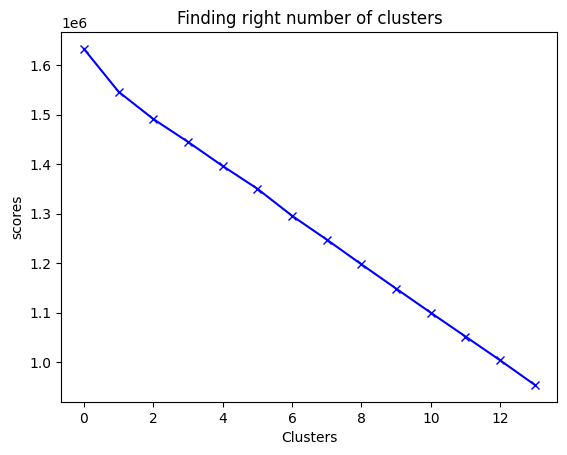

In [ ]:
scores = []
range_values = range(1, 15)

for i in range_values:
  kmeans = KMeans(n_clusters = i)
  kmeans.fit(elec_df_scaled)
  scores.append(kmeans.inertia_) ## intertia is the Sum of squared distances of samples to their closest cluster center

plt.plot(scores, 'bx-')
plt.title('Finding right number of clusters')
plt.xlabel('Clusters')
plt.ylabel('scores')
plt.show()

In [ ]:
# From this we can observe that, 5th cluster seems to be forming the elbow of the curve.
# Note that curve will change everytime we run the cell
# Cluster the data using KMeans
kmeans = KMeans(5)
kmeans.fit(elec_df_scaled)
labels = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
labels

array([1, 1, 2, ..., 3, 2, 1], dtype=int32)

In [ ]:
kmeans.cluster_centers_.shape

(5, 36)

In [ ]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [electricity_df.columns])
cluster_centers

,Fan,Refrigerator,AirConditioner,Television,Monitor,MonthlyHours,TariffRate,ElectricityBill,1,2,...,Kolkata,Mumbai,Nagpur,Navi Mumbai,New Delhi,Noida,Pune,Ratnagiri,Shimla,Vadodara
0,0.009827,0.004117,0.003368,0.018307,0.000596,0.004969,-0.987284,-0.269463,-0.017777,-0.000250,...,-0.253598,-0.258778,-0.257320,-0.262061,-0.258875,-0.256198,-0.255953,-0.261003,-0.255562,3.957108
1,-0.011393,0.015906,0.009273,-0.006939,0.000679,0.004485,-1.396277,-0.383158,0.011683,0.001651,...,-0.253598,-0.258778,-0.257320,-0.262061,-0.258875,-0.256198,-0.255953,1.141333,1.101315,-0.252710
2,-0.657480,-0.638892,-0.237510,-0.390617,-0.279756,-0.905731,0.050338,-0.861120,-0.017091,0.098983,...,0.105863,-0.211645,0.077837,-0.209087,0.157332,0.211364,-0.186373,-0.255332,-0.240761,-0.252710
3,0.083032,0.102339,0.021826,0.057206,0.017695,0.118864,1.442749,0.523379,0.010119,-0.030442,...,-0.253598,1.127331,-0.257320,1.134134,-0.258875,-0.256198,1.082182,-0.261003,-0.255562,-0.252710
4,0.478371,0.438407,0.169668,0.277631,0.210783,0.646529,0.148744,0.661485,0.004518,-0.062298,...,0.249290,-0.258778,0.276323,-0.262061,0.215549,0.169338,-0.255953,-0.260723,-0.253280,-0.252710


In [ ]:
#inverse transformation to realize what the data actually means
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [electricity_df.columns])
cluster_centers

# 3(Highest) 1(lowest)

,Fan,Refrigerator,AirConditioner,Television,Monitor,MonthlyHours,TariffRate,ElectricityBill,1,2,...,Kolkata,Mumbai,Nagpur,Navi Mumbai,New Delhi,Noida,Pune,Ratnagiri,Shimla,Vadodara
0,14.044453,21.712344,1.507715,12.608009,2.867377,515.692506,7.800000,4022.401543,0.078619,0.083027,...,7.771561e-16,-9.159340e-16,-6.938894e-17,1.026956e-15,-4.440892e-16,-1.332268e-15,2.040035e-15,-1.887379e-15,-8.673617e-16,1.000000e+00
1,13.928367,21.732062,1.514303,12.462694,2.867700,515.633135,7.564017,3900.308057,0.086770,0.083552,...,-3.060052e-15,-3.663736e-15,3.171075e-15,-4.329870e-15,-1.471046e-15,-3.386180e-15,-4.253542e-15,3.426698e-01,3.255066e-01,-6.161738e-15
2,10.393782,20.636875,1.239023,10.254265,1.775440,404.025548,8.398692,3387.036919,0.078808,0.110418,...,8.564995e-02,1.143154e-02,8.088681e-02,1.299039e-02,1.009786e-01,1.124101e-01,1.671430e-02,1.385641e-03,3.550706e-03,-7.910339e-15
3,14.444940,21.876626,1.528304,12.831909,2.933977,529.657872,9.202093,4873.815100,0.086337,0.074693,...,-2.858824e-15,3.361823e-01,3.871903e-15,3.423758e-01,-2.400857e-15,-4.170275e-15,3.214418e-01,-5.204170e-15,-3.608225e-15,-5.911938e-15
4,16.607747,22.438719,1.693218,14.100664,3.686033,594.358448,8.455471,5022.123021,0.084788,0.065900,...,1.198248e-01,-4.218847e-15,1.287894e-01,4.010681e-15,1.151030e-01,1.023062e-01,-6.848688e-15,6.843222e-05,5.474577e-04,-8.902601e-15


In [ ]:
labels.shape

(45345,)

In [ ]:
labels.max()

4

In [ ]:
labels.min()

0

In [ ]:
y_kmeans = kmeans.fit_predict(elec_df_scaled)
y_kmeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([1, 4, 1, ..., 2, 4, 1], dtype=int32)

In [ ]:
y_kmeans.shape

(45345,)

In [3]:
# Add a label (which cluster) corresponding to each data point
elec_df_cluster = pd.concat([electricity_df, pd.DataFrame({'cluster':labels})], axis = 1)
elec_df_cluster

NameError: ignored

In [ ]:
electricity_df['TariffRate'] = electricity_df['TariffRate'].apply(lambda x: float(x))

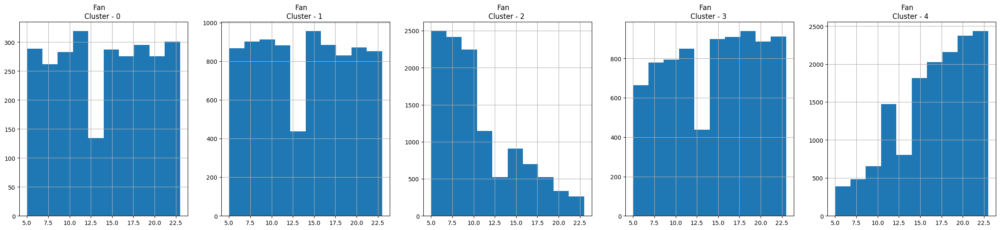

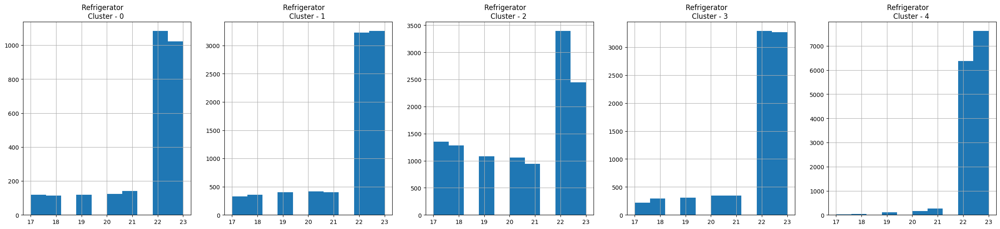

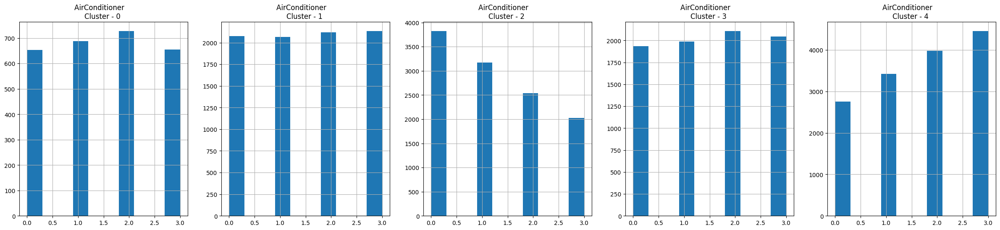

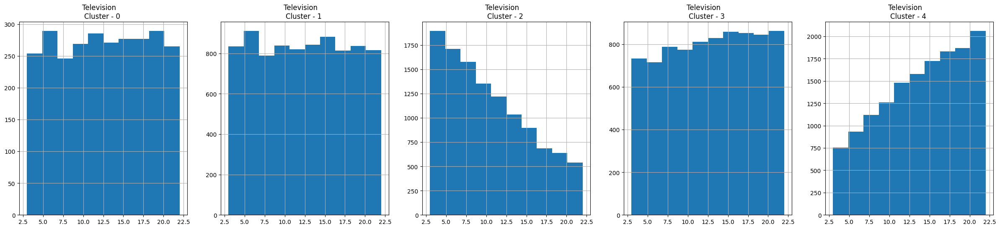

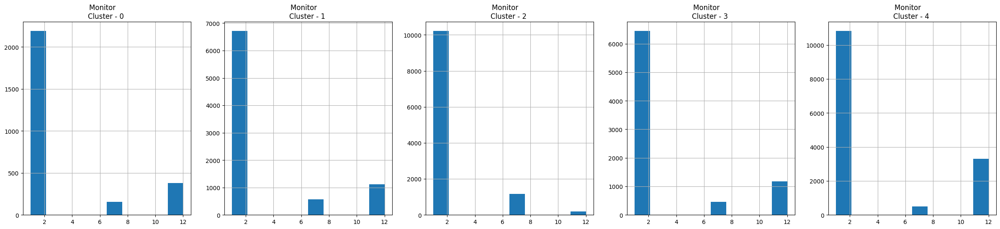

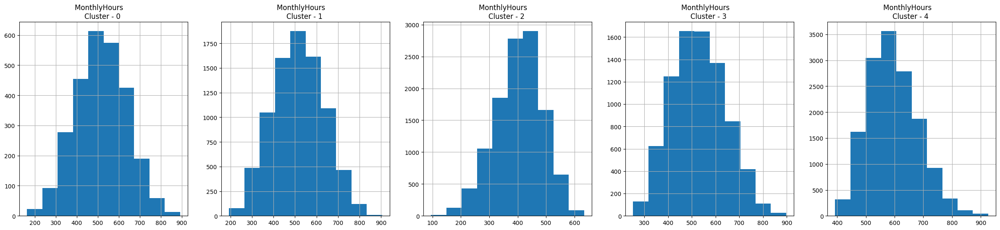

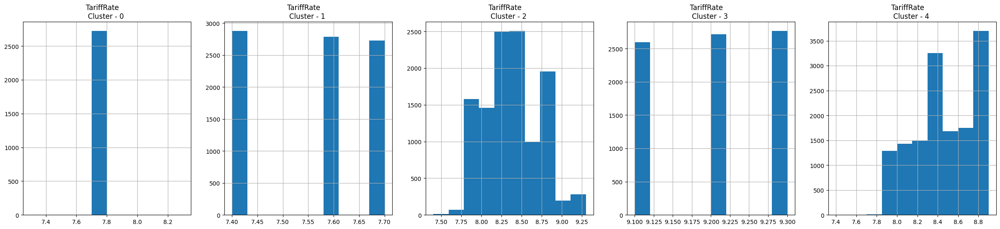

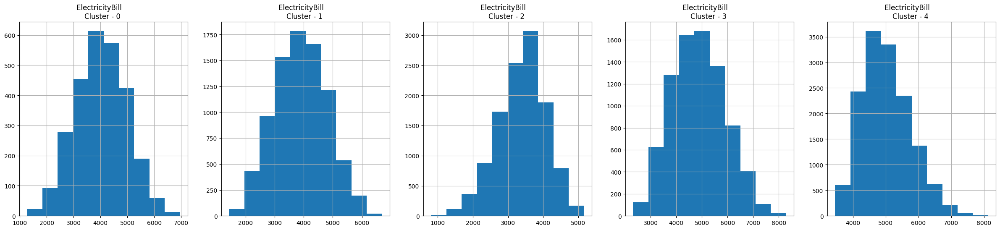

In [ ]:
# plot histogram for each feature based on cluster
for i in electricity_df.columns[:8]:
  plt.figure(figsize = (30, 6))
  for j in range(5):
    plt.subplot(1, 5, j+1)
    cluster = elec_df_cluster[elec_df_cluster['cluster'] == j]
    cluster[i].hist()
    plt.title('{}    \nCluster - {} '.format(i,j))

  plt.show()

In [ ]:
# Reduce the original data to 3 dimensions using PCA for visualizig the clusters
pca = PCA(n_components = 3)
principal_comp = pca.fit_transform(elec_df_scaled)
principal_comp

array([[-0.99521032,  0.19497109, -1.1365728 ],
       [-0.75041791, -1.37436791, -1.1007323 ],
       [-2.1031631 , -1.08577844,  1.13310491],
       ...,
       [ 1.81057636, -0.20762238,  0.30814298],
       [ 1.2079171 , -2.69035058,  2.35177038],
       [-2.38706796,  0.75062312,  1.50362089]])

In [ ]:
# Concatenate the clusters labels to the dataframe
pca_df = pd.DataFrame(data= principal_comp, columns = ['pca1', 'pca2', 'pca3'])
pca_df.head()

,pca1,pca2,pca3
0,-0.995210,0.194971,-1.136573
1,-0.750418,-1.374368,-1.100732
2,-2.103163,-1.085778,1.133105
3,0.458167,2.058373,1.221448
4,0.018284,2.095032,-1.201298


In [ ]:
pca_df = pd.concat([pca_df, pd.DataFrame({'cluster':labels})], axis = 1)
pca_df

,pca1,pca2,pca3,cluster
0,-0.995210,0.194971,-1.136573,2
1,-0.750418,-1.374368,-1.100732,0
2,-2.103163,-1.085778,1.133105,1
3,0.458167,2.058373,1.221448,3
4,0.018284,2.095032,-1.201298,3
...,...,...,...,...
45340,2.337509,-1.728161,1.676562,4
45341,1.463519,-0.290620,-2.314719,4
45342,1.810576,-0.207622,0.308143,4
45343,1.207917,-2.690351,2.351770,1


In [ ]:
# Visualize clusters using 3D-Scatterplot
fig = px.scatter_3d(pca_df, x = 'pca1', y = 'pca2', z = 'pca3',
                    color = 'cluster', symbol = 'cluster', size_max = 18, opacity = 0.7)
fig.update_layout(margin = dict(l = 0, r = 0, b = 0, t = 0))

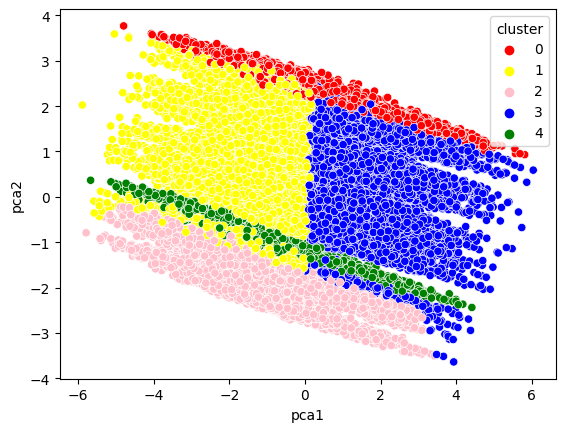

In [ ]:
ax = sns.scatterplot(x='pca1', y='pca2', hue='cluster', data=pca_df, palette = ['red', 'yellow','pink','blue','green'])
plt.show()

In [ ]:
# from keras.optimizers import SGD

# Glorot Uniform initializer: https://keras.rstudio.com/reference/initializer_glorot_uniform.html
input_df = Input(shape = (36,))
x = Dense(50, activation = 'relu')(input_df)
x = Dense(500, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)
x = Dense(500, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)
x = Dense(2000, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)
encoded = Dense(8, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)
x = Dense(2000, activation = 'relu', kernel_initializer = 'glorot_uniform')(encoded)
x = Dense(500, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)
decoded = Dense(36, kernel_initializer = 'glorot_uniform')(x)

# autoencoder
autoencoder = Model(input_df, decoded)

# encoder - used for dimensionality reduction
encoder = Model(input_df, encoded)

autoencoder.compile(optimizer = 'adam', loss='mean_squared_error')

In [ ]:
electricity_df.shape

(45345, 36)

In [ ]:
autoencoder.fit(electricity_df, electricity_df, batch_size = 128, epochs = 200, verbose = 3)

Epoch 1/200
Epoch 2/200
Epoch 3/200
Epoch 4/200
Epoch 5/200
Epoch 6/200
Epoch 7/200
Epoch 8/200
Epoch 9/200
Epoch 10/200
Epoch 11/200
Epoch 12/200
Epoch 13/200
Epoch 14/200
Epoch 15/200
Epoch 16/200
Epoch 17/200
Epoch 18/200
Epoch 19/200
Epoch 20/200
Epoch 21/200
Epoch 22/200
Epoch 23/200
Epoch 24/200
Epoch 25/200
Epoch 26/200
Epoch 27/200
Epoch 28/200
Epoch 29/200
Epoch 30/200
Epoch 31/200
Epoch 32/200
Epoch 33/200
Epoch 34/200
Epoch 36/200
Epoch 37/200
Epoch 38/200
Epoch 39/200
Epoch 40/200
Epoch 41/200
Epoch 42/200
Epoch 43/200
Epoch 44/200
Epoch 45/200
Epoch 46/200
Epoch 47/200
Epoch 48/200
Epoch 49/200
Epoch 50/200
Epoch 51/200
Epoch 52/200
Epoch 53/200
Epoch 54/200
Epoch 55/200
Epoch 56/200
Epoch 57/200
Epoch 58/200
Epoch 59/200
Epoch 60/200
Epoch 61/200
Epoch 62/200
Epoch 63/200


KeyboardInterrupt: ignored